# 스팀VR 한글 리뷰 수집하기

In [2]:
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
import requests
from IPython.display import display

from concurrent.futures import ThreadPoolExecutor
from concurrent.futures import as_completed

In [3]:
df_steam_list = pd.read_csv("./dataset/steamvr_game_list.csv", index_col=0)
df_steam_list = df_steam_list[df_steam_list["VrTarget"] == "VR Only"] # VR 전용 게임만 대상으로 필터링
df_steam_list.dropna(subset=["Genre"], inplace=True)
df_steam_list.sort_values(by=["Reviews"], ascending=False, inplace=True)
df_steam_list.reset_index(drop=True, inplace=True)
display(df_steam_list)
# display(df_steam_list.describe())

genre_list = {}
title2genre = {}
for i in range(len(df_steam_list)):
    title = str(df_steam_list.loc[i, "Title"])
    genres = df_steam_list.loc[i, "Genre"]
    
    for g in genres.split(","):
        if not g in genre_list:
            genre_list[g] = 1
    
    title2genre[title] = genres
genre_list = list(genre_list.keys())

# 게임 장르 아닌 것들 제외
genre_exeception = [
    "Indie", "Early Access", "Free to Play", "Utilities", "Design & Illustration",
    "Animation & Modeling", "Video Production", "Audio Production", "Education",
    "Accounting", "Game Development", "Photo Editing", "Software Training",
    "Web Publishing"
]
genre_list = list(set(genre_list) - set(genre_exeception))
genre_list

,Popularity,Title,Score,Reviews,Price,ReleaseDate,VrTarget,Genre,Url
0,73,Half-Life: Alyx,98,62048,59.99,2020-03-23,VR Only,"Action,Adventure",https://store.steampowered.com/app/546560/
1,50,Beat Saber,96,58175,29.99,2019-05-21,VR Only,Indie,https://store.steampowered.com/app/620980/
2,24,Blade and Sorcery,96,31159,19.99,2018-12-11,VR Only,"Action,Adventure,Early Access,Indie,RPG,Simula...",https://store.steampowered.com/app/629730/
3,16,Pavlov VR,94,30582,24.99,2017-02-27,VR Only,"Action,Early Access,Indie",https://store.steampowered.com/app/555160/
4,30,BONEWORKS,92,28132,29.99,2019-12-10,VR Only,"Action,Adventure,Indie,Simulation",https://store.steampowered.com/app/823500/
...,...,...,...,...,...,...,...,...,...
2004,0,STYLY：VR PLATFORM FOR ULTRA EXPERIENCE,100,10,0,2017-09-28,VR Only,Design & Illustration,https://store.steampowered.com/app/693990/
2005,0,WiseMind,60,10,19.99,2017-06-13,VR Only,"Early Access,Software Training",https://store.steampowered.com/app/632520/
2006,0,Tractorball,60,10,9.99,2017-10-04,VR Only,"Action,Indie,Racing,Sports",https://store.steampowered.com/app/683790/
2007,0,Sky Tower,60,10,4.99,2016-04-25,VR Only,"Casual,Indie,Simulation",https://store.steampowered.com/app/395880/


['Action',
 'RPG',
 'Racing',
 'Simulation',
 'Casual',
 'Sports',
 'Massively Multiplayer',
 'Strategy',
 'Adventure']

In [ ]:
def get_reviews(appid, params={"json": 1}):
    url = "https://store.steampowered.com/appreviews/" + appid
    r = requests.get(url=url, params=params, headers={"User-Agent": "Mozilla/5.0"})
    return r.json()

def get_n_reviews(appid, n=100):
    reviews = []
    cursor = "*"
    params = {
        "json": 1,
        "filter": "all",
        "language": "korean",
        "day_range": 9223372036854775807,
        "review_type": "all",
        "purchase_type": "all"
    }

    while n > 0:
        params["cursor"] = cursor.encode()
        params["num_per_page"] = min(100, n)
        n -= 100

        r = get_reviews(appid, params=params)
        cursor = r["cursor"]
        reviews += r["reviews"]

        if len(r["reviews"]) < 100:
            break
    
    return reviews

In [ ]:
MAX_REVIEWS_PER_APP = 3000

def scrape_wrapper(start: int, end: int)->pd.DataFrame:
    df_piece = pd.DataFrame()
    for i in tqdm(range(start, end)):
        title = df_steam_list.loc[i, "Title"]
        # genre = df_steam_list.loc[i, "Genre"]
        appid = df_steam_list.loc[i, "Url"].split("/")[-2]

        df_reviews = pd.DataFrame(get_n_reviews(appid, n=MAX_REVIEWS_PER_APP))
        if df_reviews is None:
            print(f"{title} failed to scrape. Skip")
            continue

        df_reviews = pd.concat({title: df_reviews}, names=["Title"])
        df_piece = pd.concat([df_piece, df_reviews])
    
    return df_piece

def multi_scrape()->pd.DataFrame:
    swamp_end = 300
    swamp = [(i, i+30) for i in range(0, swamp_end, 30)] # 처음 300개 게임은 리뷰 매우 많음 -> 최대한 업무 분산
    work_list = swamp + [(i, min(i + 300, len(df_steam_list))) for i in range(swamp_end, len(df_steam_list), 300)]
    print(work_list)

    df_result = pd.DataFrame()
    with ThreadPoolExecutor(max_workers=8) as executor:
        futures = [executor.submit(scrape_wrapper, work[0], work[1]) for work in work_list]

        for future in as_completed(futures):
            result = future.result()
            df_result = pd.concat([df_result, result])
    
    return df_result

In [ ]:
multi_scrape().to_csv(f"./dataset/steamvr_reviews_kor_n{MAX_REVIEWS_PER_APP}.csv")

# 장르별 키워드를 워드클라우드로 시각화

In [4]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from konlpy.tag import Okt
from collections import Counter
from PIL import Image

import plotly.express as px
import plotly.io as pio
pio.renderers.default = "notebook"

In [5]:
df_reviews = pd.read_csv("./dataset/steamvr_reviews_kor_n3000.csv", index_col=[0,1], encoding="utf-8")

# 장르 표시
df_reviews["genre"] = ""
for title in df_reviews.index.levels[0]:
    df_reviews.loc[title, "genre"] = title2genre[title]
df_reviews.head()

recommendationid  \
Title                                                       
Google Spotlight Stories: Age of Sail 0          53503950   
                                      1          99703375   
                                      2          99446318   
                                      3          91647912   
                                      4          76330826   

                                                                                    author  \
Title                                                                                        
Google Spotlight Stories: Age of Sail 0  {'steamid': '76561198084409976', 'num_games_ow...   
                                      1  {'steamid': '76561198408546403', 'num_games_ow...   
                                      2  {'steamid': '76561198052867969', 'num_games_ow...   
                                      3  {'steamid': '76561198034255347', 'num_games_ow...   
                                      4  {'steamid': '76561198005702054', 'num_games_ow...   

                                        language  \
Title                                              
Google Spotlight Stories: Age of Sail 0  koreana   
                                      1  koreana   
                                      2  koreana   
                                      3  koreana   
                                      4  koreana   

                                                                                    review  \
Title                                                                                        
Google Spotlight Stories: Age of Sail 0  애니메이션 VR 영상입니다.\n영상은 11분이내이며, 영상, 스토리, 연출 무엇하나...   
                                      1                                                 낭만   
                                      2                               이걸 깔아놓고 왜 지금까지 안봤지;;   
                                      3            구글 스포라이트 스토리 시리즈중 가장 최고의 퀄리티, VR영업할때 좋음   
                                      4   뭐랄까 1시간짜리 영화로 나오면 대박 칠 듯 감상하는 내내 그 세계에 빠진듯한 기...   

                                         timestamp_created  timestamp_updated  \
Title                                                                           
Google Spotlight Stories: Age of Sail 0         1562240777         1562240777   
                                      1         1632173214         1632173214   
                                      2         1631799611         1631799895   
                                      3         1620482828         1648316645   
                                      4         1600695915         1600695915   

                                         voted_up  votes_up  votes_funny  \
Title                                                                      
Google Spotlight Stories: Age of Sail 0      True         5            0   
                                      1      True         1            0   
                                      2      True         0            0   
                                      3      True         0            0   
                                      4      True         0            0   

                                         weighted_vote_score  comment_count  \
Title                                                                         
Google Spotlight Stories: Age of Sail 0              0.60000              0   
                                      1              0.52381              0   
                                      2              0.00000              0   
                                      3              0.00000              0   
                                      4              0.00000              0   

                                         steam_purchase  received_for_free  \
Title                                                                        
Google Spotlight Stories: Age of Sail 0           False              False   
                                      1  


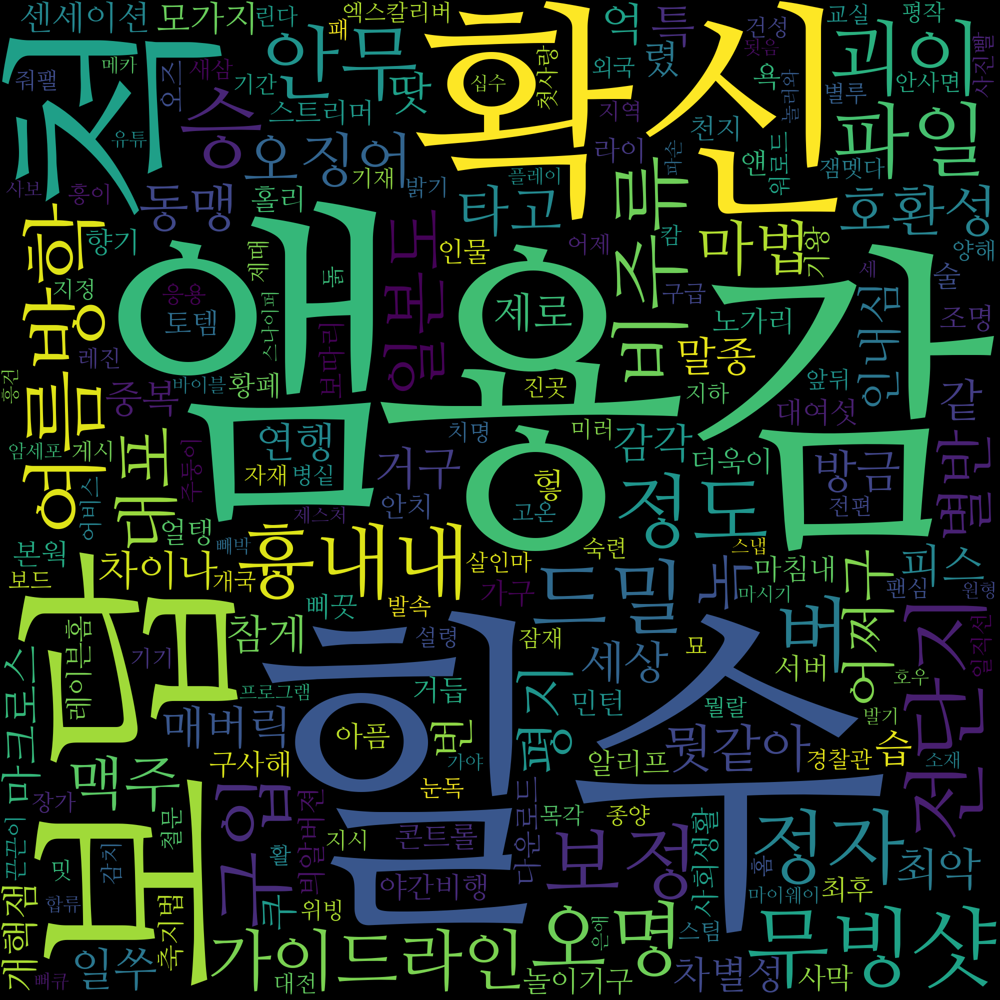


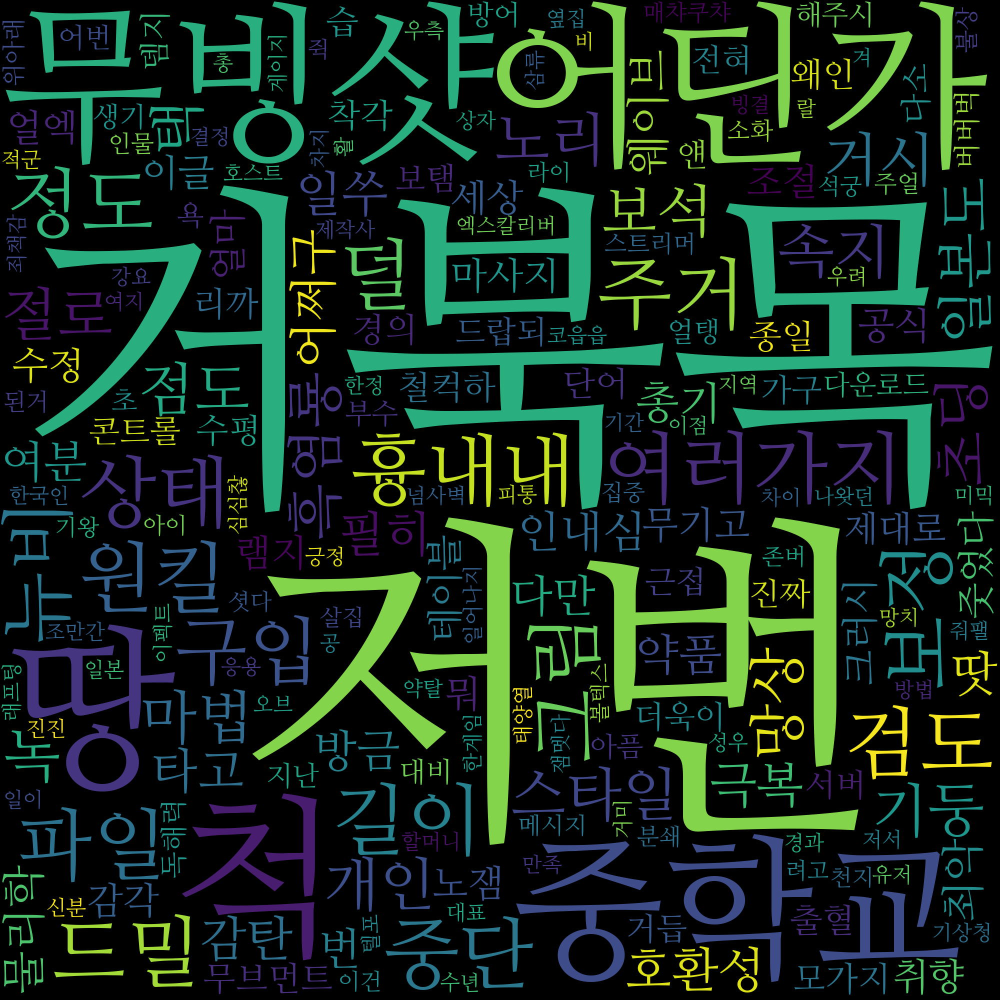


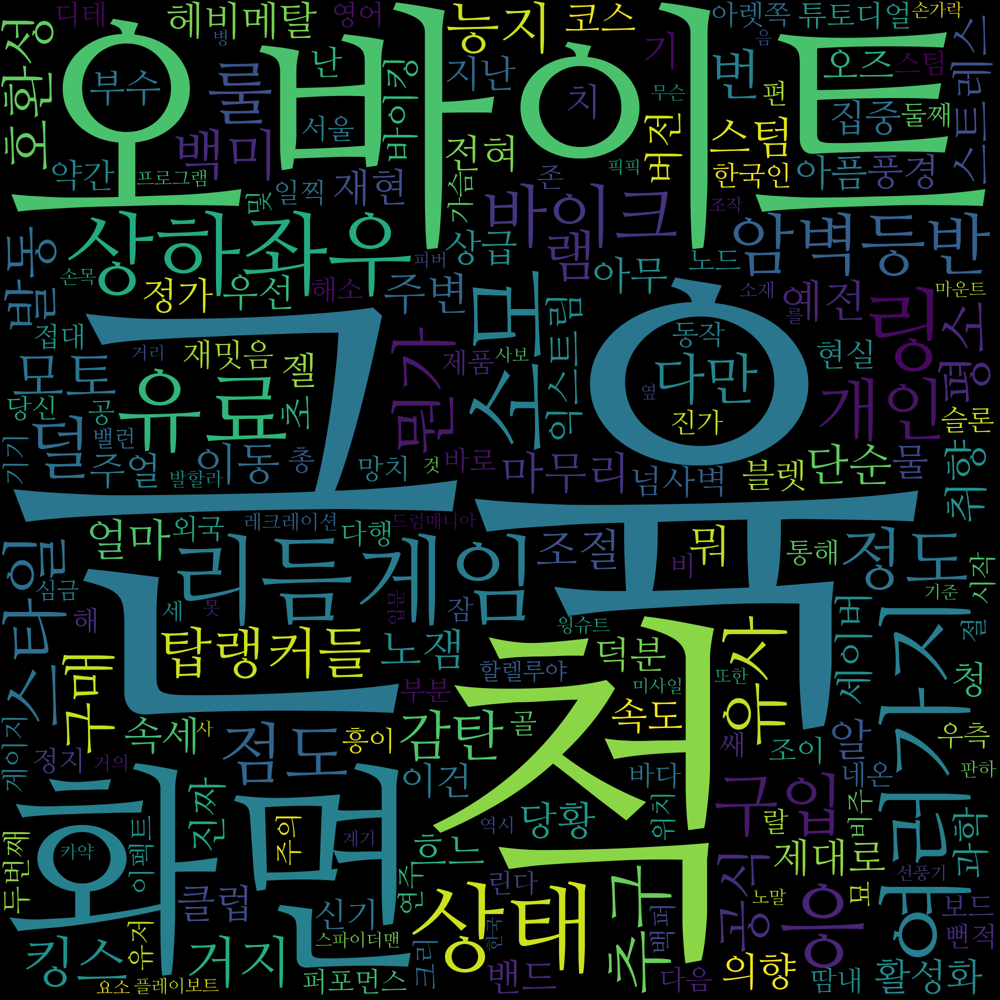


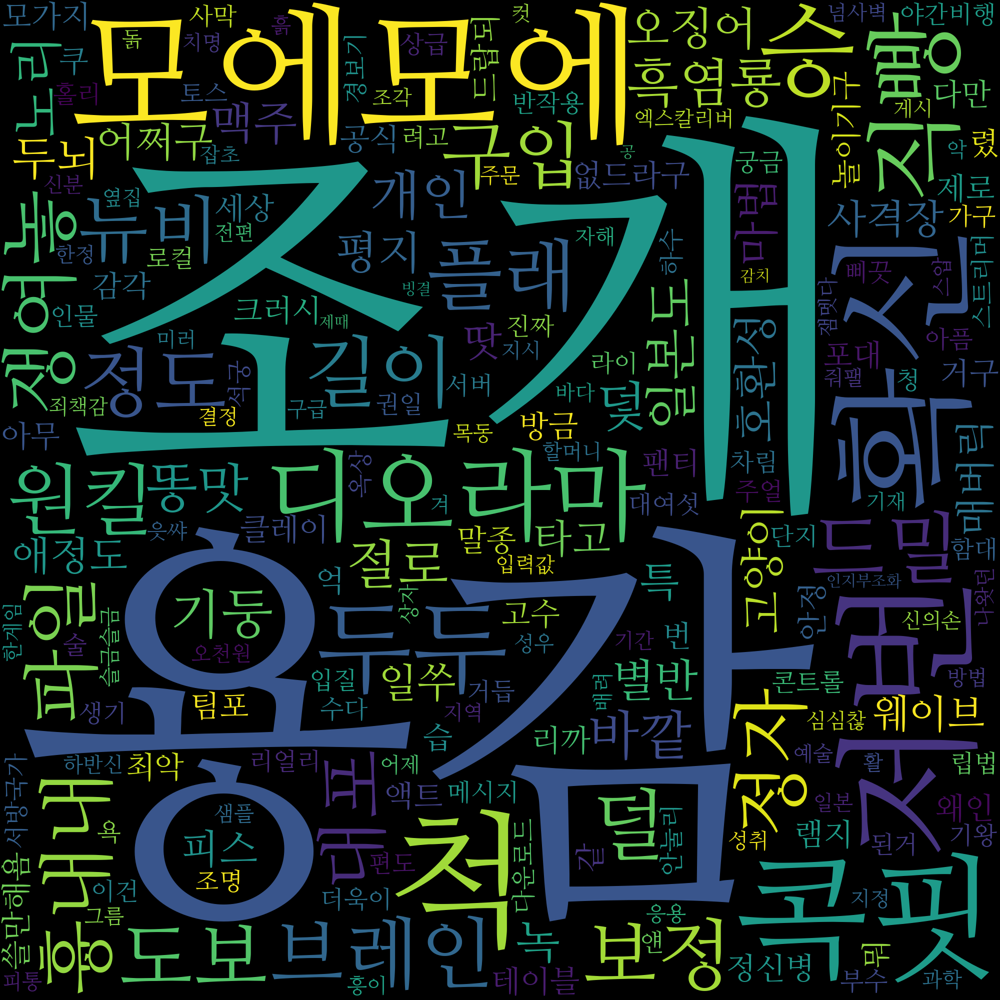


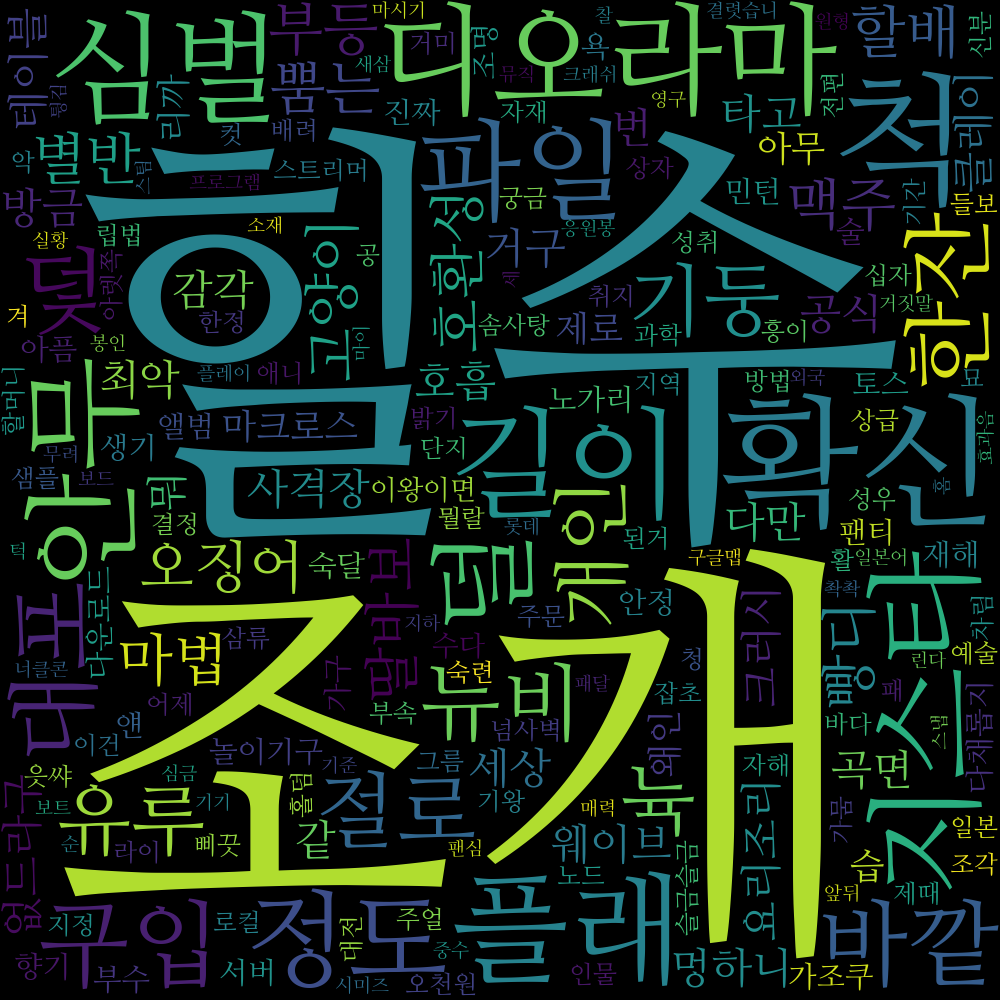


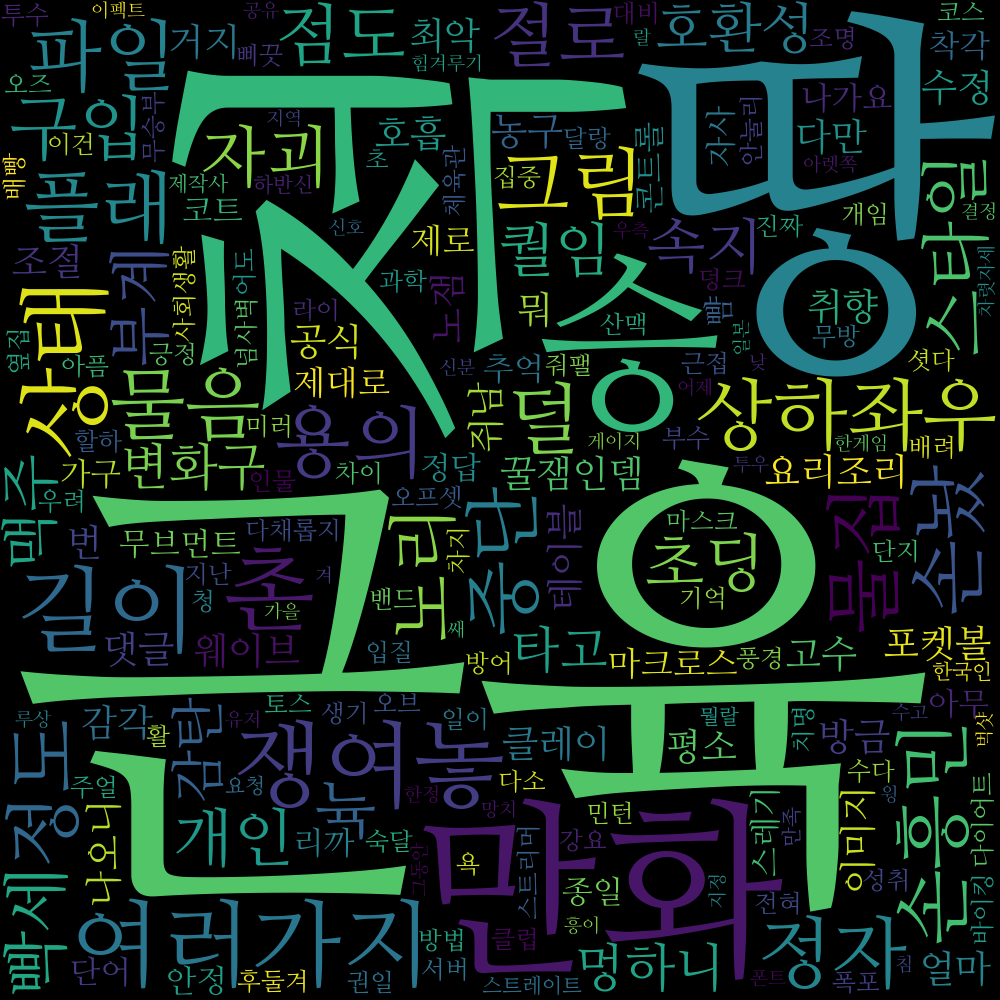


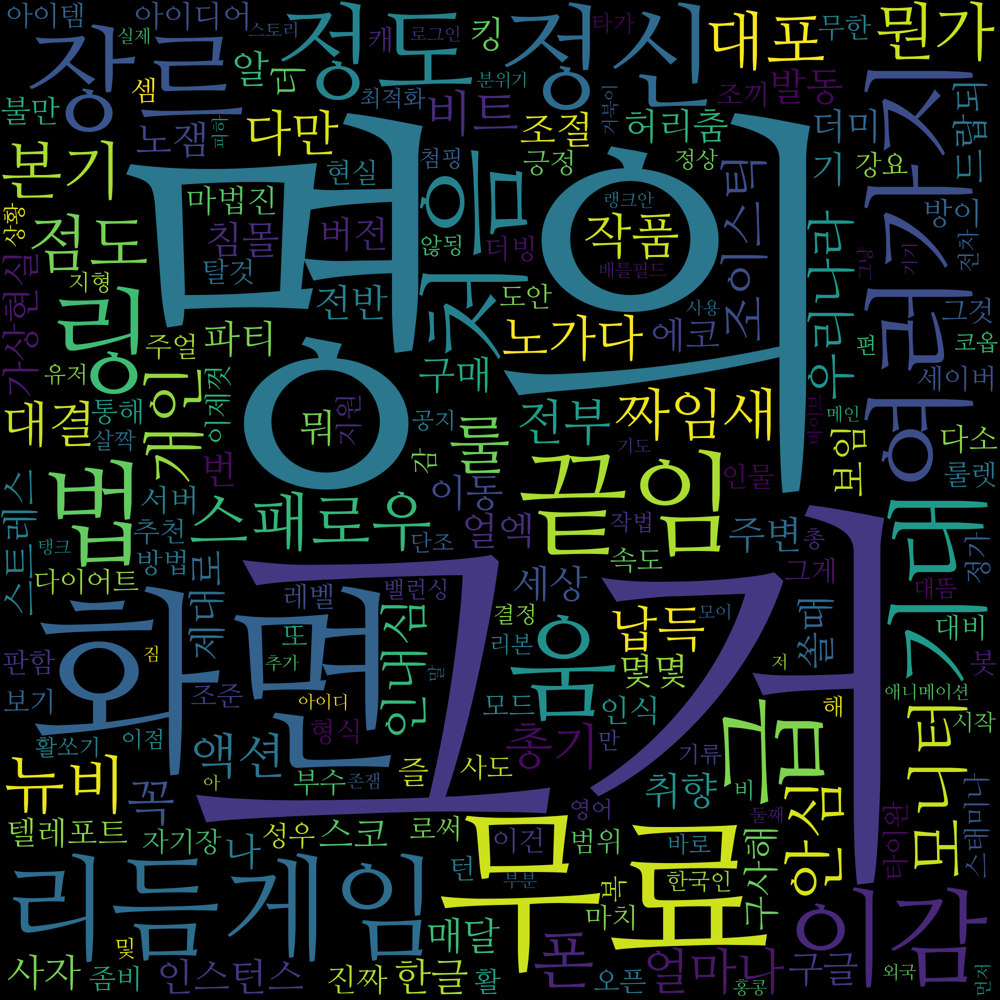


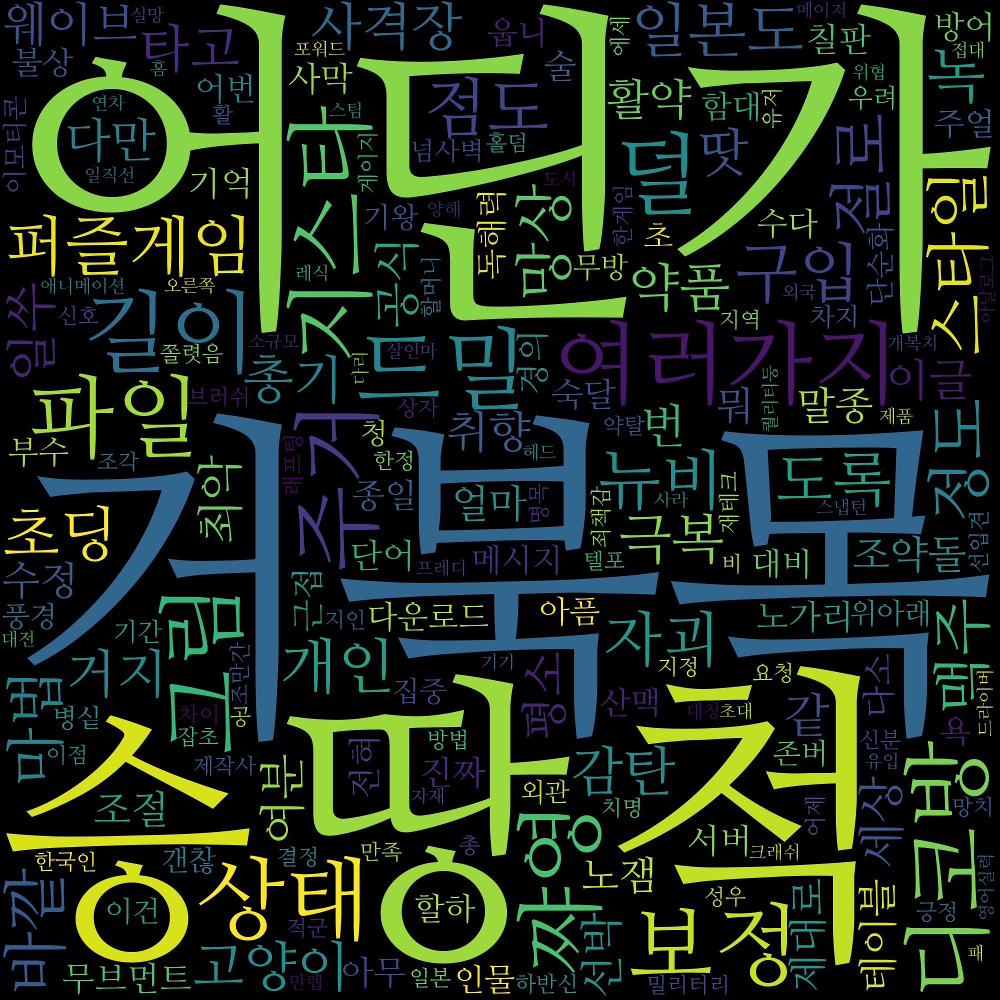


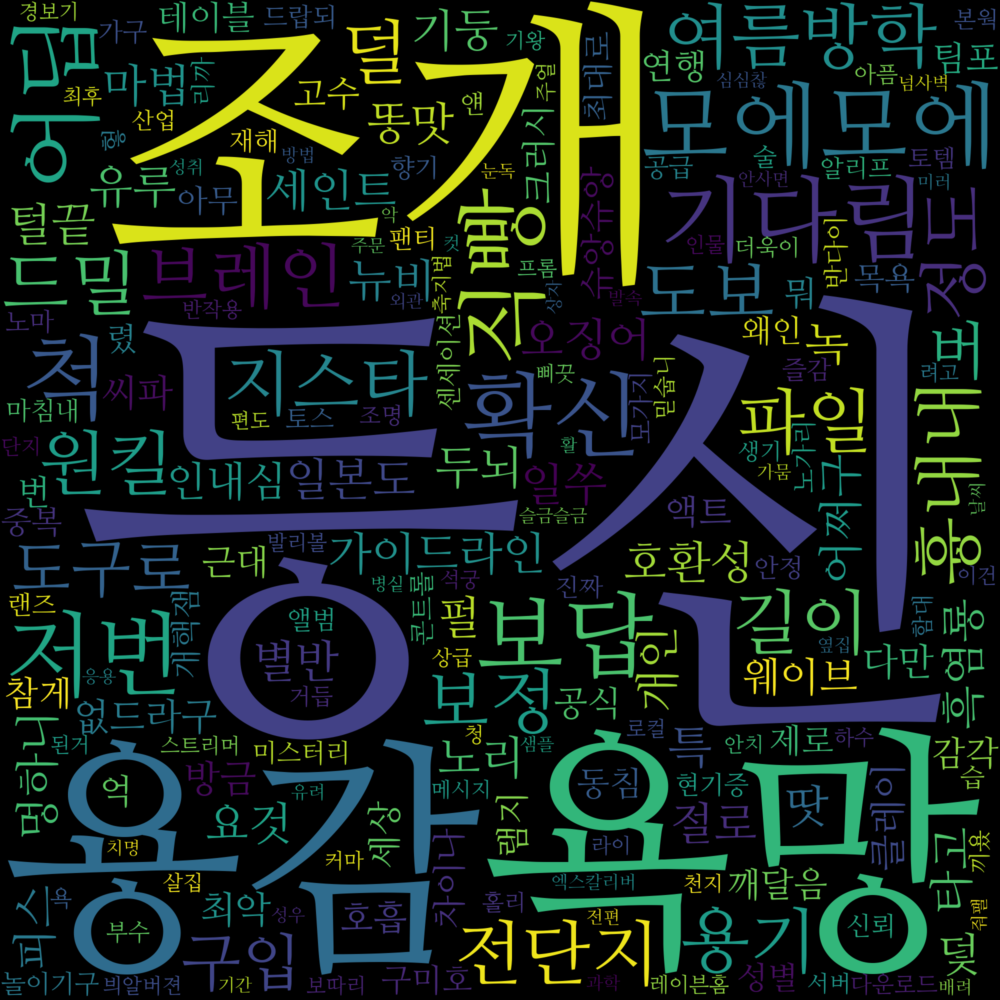

In [6]:
# 관용적인 표현 단어들 제외
stopwords = [
    "VR", "vr", "게임"
] + list(STOPWORDS)

# 한글 폰트를 지정해주지 않으면 깨진다!
font_path = "/Users/CUop/Library/Fonts/NanumMyeongjo.ttf"

for genre in genre_list:
    df_genre = df_reviews.loc[df_reviews["genre"].str.contains(genre)]
    review_text = df_genre["review"].str.cat(sep="\n")

    okt = Okt()
    nouns = okt.nouns(review_text) # 명사만 추출
    nouns = list(set(nouns) - set(stopwords))
    word_freq = Counter(nouns)

    wc = WordCloud(
        stopwords=stopwords, width=1000, height=1000, scale=2.0,
        font_path=font_path
    )
    cloud = wc.generate_from_frequencies(word_freq)

    fig = px.imshow(cloud)
    fig.update_layout(title=genre, title_x=0.5, font=dict(size=20))
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    fig.show()
